# Today you are a Machine Learning Engineer at the Department of Marketing and Inventory @Walmart Labs.
This work relies on processed data from Kaggle https://www.kaggle.com/mkechinov/ecommerce-behavior-data-from-multi-category-store

This work is motivated by the publication https://arxiv.org/pdf/2010.02503.pdf

## You have access to the Walmart server data, specifically the Electronics section, such that you have NO customer facing information, but, only access to timestamped data regarding product viewing/carting/purchasing as follows.


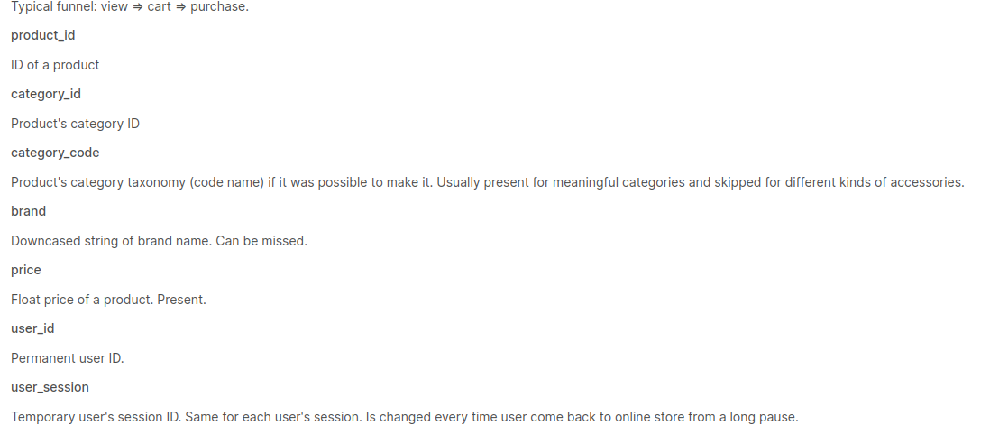

In [1]:
from IPython.display import Image
Image(filename='image1.png')

## The first step is to convert session level information to User-journey level data, i.e. track time stamps from a particulat userID-Product ID combination over time to see if the combination results in a purchase (Y=1) or not (Y=0). The user journey level features extracted for this data set looks as follows:

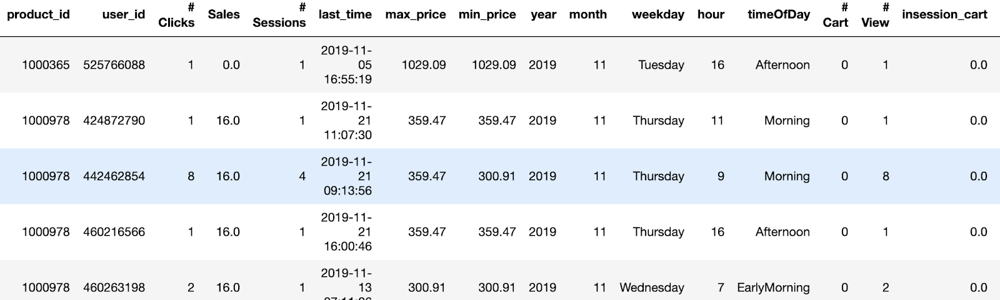

In [2]:
Image(filename='image10.png')

## You have access to user journey level data. Your goal is to perform the following:
## A. To identify what features are most important to classify purchasing customers from non-purchasing customers
## B. To predict a purchasing customer-product interaction from a no-purchasing one. The goal is to build the "best" data model with regards to Recall and F1-score.

## Task 0 (Initialization): Understand the Data!

In [3]:
## Importing required Libraries
import os
import tensorflow as tf
import numpy as np
import pandas as pd
import seaborn as sns

In /Users/leo/anaconda3/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The savefig.frameon rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
In /Users/leo/anaconda3/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The verbose.level rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
In /Users/leo/anaconda3/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The verbose.fileo rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.


### Read in the training data, print its shape, and display its first few rows

In [4]:
### START CODE HERE ###
X_train = pd.read_csv('X_train.csv')
print(X_train.shape)
X_train.head()
### END CODE HERE ###

(645816, 15)


,NumOfEventsInJourney,NumSessions,interactionTime,maxPrice,minPrice,NumCart,NumView,InsessionCart,InsessionView,year,month,weekday,timeOfDay,Weekend,Purchase
0,1,1,0.0,154.41,154.41,0,1,0,1,2019,11,Sat,Morning,0,0
1,1,1,0.0,92.67,92.67,0,1,0,1,2019,11,Fr,Dawn,0,0
2,1,1,0.0,155.71,155.71,0,1,0,1,2019,11,Thu,Afternoon,0,0
3,1,1,0.0,898.32,898.32,0,1,0,1,2019,11,Mon,Noon,0,0
4,1,1,0.0,146.21,146.21,0,1,0,1,2019,11,Tue,Noon,0,0


## Data Wrangling!

### Find the non-numeric features

In [5]:
### START CODE HERE ###
non_numeric_columns = list(X_train.select_dtypes(exclude=np.number).columns)
print(non_numeric_columns)
### END CODE HERE ###

['weekday', 'timeOfDay']


### Print the unique values of the non-numeric features

In [6]:
### START CODE HERE ###
# Loop through the non-numeric columns
for col in non_numeric_columns:
    # Print the counts of each unique value in the current column
    print('{0}\n'.format(X_train[col].value_counts()))
### END CODE HERE ###

Sat    126504
Fr     123677
Sun    110305
Thu     78638
Mon     71479
Tue     67850
Wed     67363
Name: weekday, dtype: int64

Afternoon       165214
EarlyMorning    136248
Evening         110578
Morning         103407
Dawn             80495
Noon             34242
Night            15632
Name: timeOfDay, dtype: int64



### Convert the non-numeric features to numeric

Remember, these feature values are ordered temporally

In [7]:
X_train['weekday'] = X_train['weekday'].replace(['Mon','Tue','Wed','Thu','Fr','Sat','Sun'],[1,2,3,4,5,6,7])
### START CODE HERE ###
X_train['timeOfDay'] = X_train['timeOfDay'].replace(
    ['Dawn', 'EarlyMorning', 'Morning', 'Noon', 'Afternoon', 'Evening', 'Night'], [1, 2, 3, 4, 5, 6, 7])
### END CODE HERE ###
print(X_train.shape)
X_train.head()

(645816, 15)


,NumOfEventsInJourney,NumSessions,interactionTime,maxPrice,minPrice,NumCart,NumView,InsessionCart,InsessionView,year,month,weekday,timeOfDay,Weekend,Purchase
0,1,1,0.0,154.41,154.41,0,1,0,1,2019,11,6,3,0,0
1,1,1,0.0,92.67,92.67,0,1,0,1,2019,11,5,1,0,0
2,1,1,0.0,155.71,155.71,0,1,0,1,2019,11,4,5,0,0
3,1,1,0.0,898.32,898.32,0,1,0,1,2019,11,1,4,0,0
4,1,1,0.0,146.21,146.21,0,1,0,1,2019,11,2,4,0,0


## Now do the same with the test data

### First, read it in, then print its shape and first few rows

In [8]:
### START CODE HERE ###
X_test = pd.read_csv('X_test.csv')
print(X_test.shape)
X_test.head()
### END CODE HERE ###

(430544, 15)


,NumOfEventsInJourney,NumSessions,interactionTime,maxPrice,minPrice,NumCart,NumView,InsessionCart,InsessionView,year,month,weekday,timeOfDay,Weekend,Purchase
0,1,1,0.0,126.86,126.86,0,1,0,1,2019,11,Wed,EarlyMorning,0,0
1,2,2,182.0,118.38,118.38,0,2,0,1,2019,11,Fr,EarlyMorning,0,0
2,1,1,0.0,63.77,63.77,0,1,0,1,2019,11,Fr,Morning,0,0
3,1,1,0.0,32.18,32.18,0,1,0,3,2019,11,Fr,EarlyMorning,0,0
4,1,1,0.0,1093.72,1093.72,0,1,0,2,2019,11,Sat,EarlyMorning,0,0


### Convert the non-numeric features

In [9]:
### START CODE HERE ###
X_test['weekday'] = X_test['weekday'].replace(['Mon','Tue','Wed','Thu','Fr','Sat','Sun'],[1,2,3,4,5,6,7])
X_test['timeOfDay'] = X_test['timeOfDay'].replace(
    ['Dawn', 'EarlyMorning', 'Morning', 'Noon', 'Afternoon', 'Evening', 'Night'], [1, 2, 3, 4, 5, 6, 7])
### END CODE HERE ###
print(X_test.shape)
X_test.head()

(430544, 15)


,NumOfEventsInJourney,NumSessions,interactionTime,maxPrice,minPrice,NumCart,NumView,InsessionCart,InsessionView,year,month,weekday,timeOfDay,Weekend,Purchase
0,1,1,0.0,126.86,126.86,0,1,0,1,2019,11,3,2,0,0
1,2,2,182.0,118.38,118.38,0,2,0,1,2019,11,5,2,0,0
2,1,1,0.0,63.77,63.77,0,1,0,1,2019,11,5,3,0,0
3,1,1,0.0,32.18,32.18,0,1,0,3,2019,11,5,2,0,0
4,1,1,0.0,1093.72,1093.72,0,1,0,2,2019,11,6,2,0,0


### Determine the fractions of user journeys which result in purchases in both the training and test datasets. Are the datasets balanced?

In [10]:
### START CODE HERE ###
# Extract the 'Purchase' columns of the datasets as your targets
y_train = X_train['Purchase']
y_test  = X_test['Purchase']
# You can change the wording of the print() commands from "Percentage" to "Fraction" if you prefer
print(f'Percentage of purchases in training = {(np.sum(y_train)*100)/len(y_train)}') 
print(f'Percentage of purchases in test = {(np.sum(y_test)*100)/len(y_test)}')
### END CODE HERE ###

Percentage of purchases in training = 1.3900244032355966
Percentage of purchases in test = 1.421457504924003


# Task 1: To find the optimal set of features for this data set. Visualize each feature's contribution to separate Purchase=0 from Purchase=1, and select the top two features (for scatter plot)
    

In [11]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import RidgeCV, LassoCV, Ridge, Lasso
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
import seaborn as sns
print(f'The training data currently has {X_train.shape[1]} features')

The training data currently has 15 features


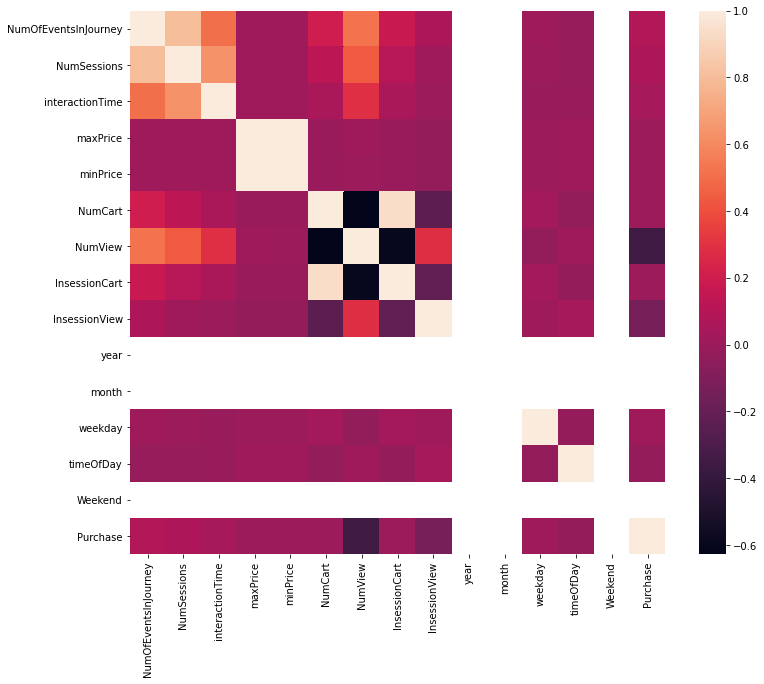

In [12]:
#Visual inspection of features
plt.figure(figsize=(12,10))
### START CODE HERE ###
# Compute the Pearson Correlation of each feature in the training df
cor = X_train.corr()
### END CODE HERE ###
# Plot the correlations
sns.heatmap(cor)
plt.show()
# Some intersting correlations pop up that need further analysis (later)
# we need to eliminate features that have very high absolute correlations

### Fill (replace) NaN values in the correlation matrix with 1 so the associated features (with no variance) can be removed

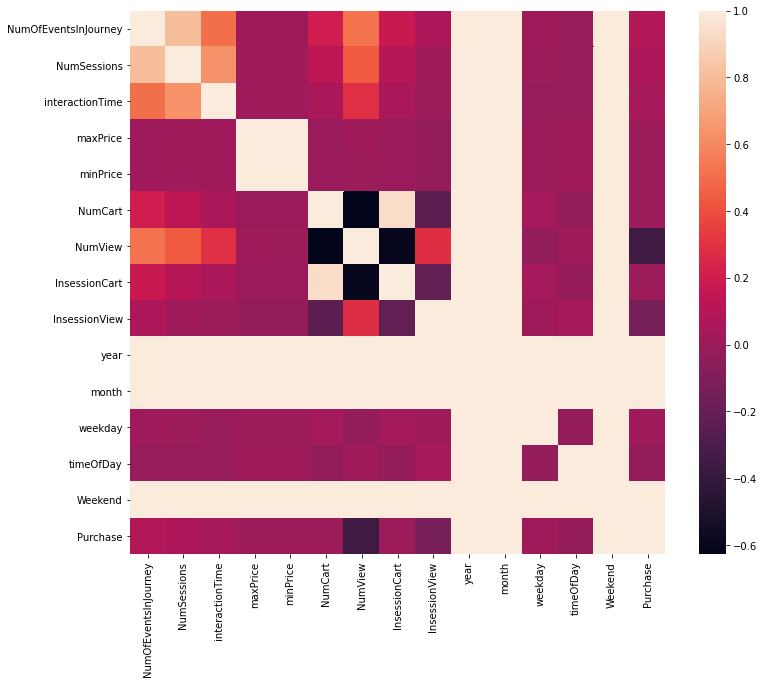

In [13]:
### START CODE HERE ###
plt.figure(figsize=(12,10))
cor = cor.replace(np.nan, 1)
sns.heatmap(cor)
plt.show()
### END CODE HERE ###

### Drop features with high correlations

In [14]:
### START CODE HERE ###
# Initialize a list indicating whether to keep a column in the training df
# For now, set all entries to True
keep_columns = [True for _ in X_train.columns]
# Loop over all columns
for i in range(len(X_train.columns)):
    # Loop over all columns to the right of the current one
    for j in range(i + 1, len(X_train.columns)):
        # If the absolute correlation between the current two columns is greater than or equal to 0.8, or no correlation 0 value...
        if abs(cor[X_train.columns[i]][X_train.columns[j]]) >= 0.8:
            # If we haven't already told the keep_columns list to drop column j...
            # Drop column j
            keep_columns[j] = False
# Extract the columns to keep from the training df
selected_columns = [X_train.columns[i] for i in range(len(X_train.columns)) if keep_columns[i]]
selected_columns.append('Purchase')
# Make a new df with the columns we've decided to keep from the training df
X_out = X_train[selected_columns]
### END CODE HERE ###
print('The following columns are present in the new data:')
print(selected_columns)
print(f'The old data had {X_train.shape[1]} features. The new df has {X_out.shape[1]} features.')
print(y_train.shape)
X_out.head()

The following columns are present in the new data:
['NumOfEventsInJourney', 'interactionTime', 'maxPrice', 'NumCart', 'NumView', 'InsessionView', 'Purchase']
The old data had 15 features. The new df has 7 features.
(645816,)


,NumOfEventsInJourney,interactionTime,maxPrice,NumCart,NumView,InsessionView,Purchase
0,1,0.0,154.41,0,1,1,0
1,1,0.0,92.67,0,1,1,0
2,1,0.0,155.71,0,1,1,0
3,1,0.0,898.32,0,1,1,0
4,1,0.0,146.21,0,1,1,0


### Feature Selection on p-value (statistical significance to Y value)

In [15]:
selected_columns = selected_columns[0:]
import statsmodels.api as sm
def backwardElimination(x, y, sl, columns):
    numVars = len(x[0])
    for i in range(0, numVars):
        regressor_OLS = sm.OLS(y, x).fit()
        #maxVar = max(regressor_OLS.pvalues).astype(float)
        maxVar = max(regressor_OLS.pvalues)
        if maxVar > sl:
            for j in range(0, numVars - i):
                if (regressor_OLS.pvalues[j].astype(float) == maxVar):
                    x = np.delete(x, j, 1)
                    columns = np.delete(columns, j)
                    
    regressor_OLS.summary()
    return x, columns
SL = 0.01
# Note that we're passing in df_out, not df_train
data_modeled, selected_columns = backwardElimination(X_out.values, y_train, SL, selected_columns)

In [16]:
print('The following columns remain based on p-value selection:')
print(selected_columns)
# Make a reduced df
data_red = pd.DataFrame(data = data_modeled, columns = selected_columns)
print(f'After selection by Pearson Correlation, we had {X_out.shape[1]} features.')
print(f'After selection by p-value, we have {data_red.shape[1]} features.')

The following columns remain based on p-value selection:
['NumOfEventsInJourney', 'interactionTime', 'maxPrice', 'NumCart', 'NumView', 'InsessionView', 'Purchase']
After selection by Pearson Correlation, we had 7 features.
After selection by p-value, we have 7 features.


### Visualize the selected features

Ignore the warning messages about distplot. I should replace it with displot, but I haven't figured out how to overlay plots with it.

/Users/leo/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/Users/leo/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


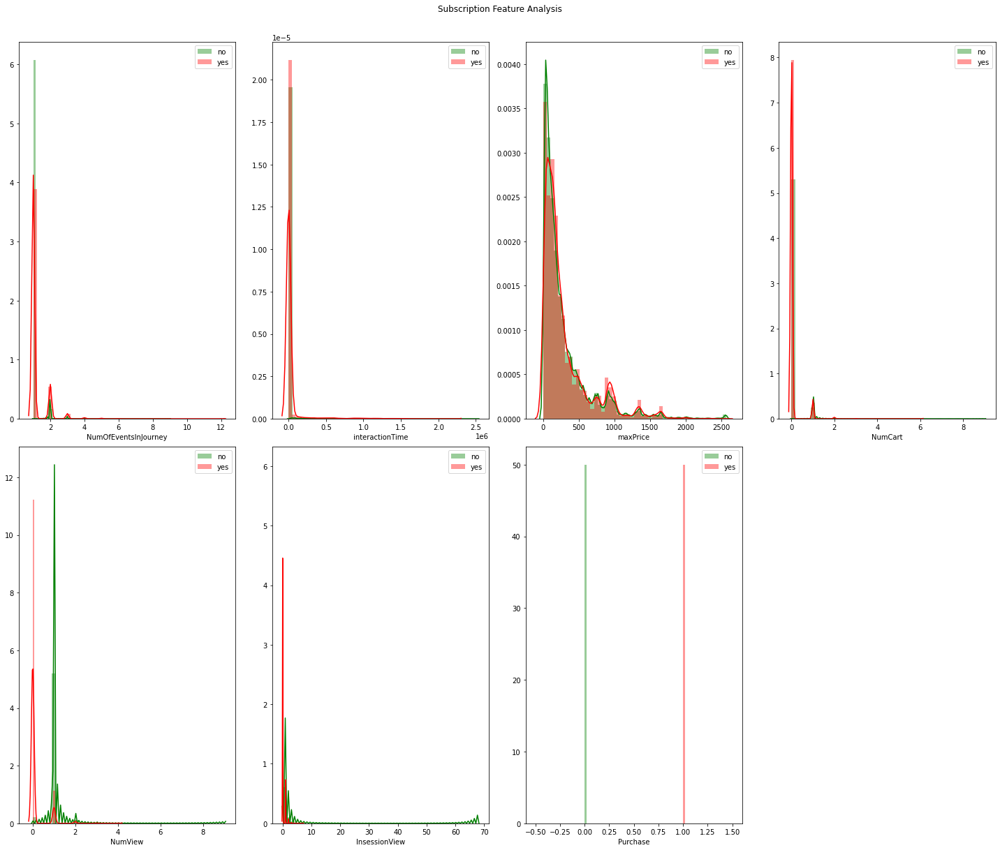

In [17]:
fig = plt.figure(figsize = (20, 25))
j = 0
for i in data_red.columns:
    plt.subplot(3, 4, j+1)
    j += 1
    sns.distplot(data_red[i][data_red['Purchase']==0], color='g', label = 'no')
    sns.distplot(data_red[i][data_red['Purchase']==1], color='r', label = 'yes')
    plt.legend(loc='best')
fig.suptitle('Subscription Feature Analysis')
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

### Drop purchase from the features of X_train and X_test and scale the features so the max norm of each feature is 1. Also, convert the X DataFrames and y Series to NumPy arrays for use with the visualization convenience function which we'll set up next.

In [18]:
from sklearn.preprocessing import normalize
# Note that this function outputs NumPy arrays by default
### START CODE HERE ###
X_train = X_train[selected_columns]
X_train = X_train.drop(columns='Purchase')
X_train = normalize(X_train, axis=0, norm='max')
y_train = np.array(y_train)
### END CODE HERE ###

In [19]:
### START CODE HERE ###
X_test = X_test[selected_columns]
X_test = X_test.drop(columns='Purchase')
X_test = normalize(X_test, axis=0, norm='max')
y_test = np.array(y_test)
### END CODE HERE ###
print(X_train.shape)
print(X_test.shape)

(645816, 6)
(430544, 6)


[[0.08333333 0.         0.05998671 0.         0.11111111 0.01470588]
 [0.08333333 0.         0.03600135 0.         0.11111111 0.01470588]
 [0.08333333 0.         0.06049175 0.         0.11111111 0.01470588]
 [0.08333333 0.         0.34898818 0.         0.11111111 0.01470588]
 [0.08333333 0.         0.0568011  0.         0.11111111 0.01470588]]
Feature ranking:
1. feature 3 (0.501193)
2. feature 4 (0.367738)
3. feature 5 (0.093052)
4. feature 0 (0.028238)
5. feature 1 (0.007418)
6. feature 2 (0.002363)
['NumOfEventsInJourney', 'interactionTime', 'maxPrice', 'NumCart', 'NumView', 'InsessionView', 'Purchase']


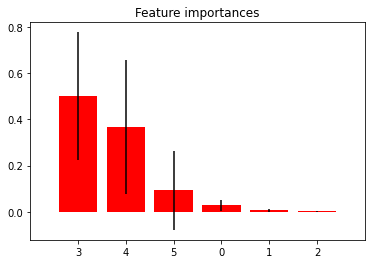

In [20]:
print(X_train[:5])
#Use Random Forest to get feature ranks/importances for each feature
from sklearn.datasets import make_classification
from sklearn.ensemble import ExtraTreesClassifier

# Build a forest and compute the impurity-based feature importances
forest = ExtraTreesClassifier(n_estimators=20,
                              random_state=0)

forest.fit(X_train, y_train)
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(X_train.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

print(selected_columns)
    
# Plot the impurity-based feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(X_train.shape[1]), importances[indices],
        color="r", yerr=std[indices], align="center")
plt.xticks(range(X_train.shape[1]), indices)
plt.xlim([-1, X_train.shape[1]])
plt.show()


## Thus features 3 and 4 (numcart, numview) are the top two rated features that can be used to visualize. Let's set up a convenience function for this purpose.

Note that `X`, `y`, and `yhat` must be NumPy arrays for this function to work

In [21]:
# This function visualizes the classification output on scatter plot
# Feature 1 (Interaction Time is used to observe the impact of low ranked feature)
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
def visualize_scatter_plot(X, y, yhat, title):
    loc11=np.where((y>0) & (yhat>0),1,0) #TP
    loc00=np.where((y==0) & (yhat==0),1,0) #TN
    loc10=np.where((y>0) & (yhat==0),1,0) #FN
    loc01=np.where((y==0) & (yhat>0),1,0) #FP
    fig = plt.figure(figsize = (10, 7))
    ax = plt.axes(projection ="3d")
    ax.scatter3D(X[np.where(loc00>0),3],X[np.where(loc00>0),4],X[np.where(loc00>0),1],color='blue', marker='o')
    ax.scatter3D(X[np.where(loc10>0),3],X[np.where(loc10>0),4],X[np.where(loc10>0),1],color='cyan', marker='o')
    ax.scatter3D(X[np.where(loc11>0),3],X[np.where(loc11>0),4],X[np.where(loc11>0),1],color='red', marker='^')
    ax.scatter3D(X[np.where(loc01>0),3],X[np.where(loc01>0),4],X[np.where(loc01>0),1],color='green', marker='^')
    ax.set_xlabel('NumCart')
    ax.set_ylabel('NumViews')
    ax.set_zlabel('InteractionTime')
    plt.title(title)
    plt.show()

# Task 2. Fit a linear model. Pick from SVM, LR. Report results
Ensure each model is the fitted with the best hyperparameters. That includes mitigating the effects of any class imbalances.

### Import models, metrics, and convenience functions

In [22]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score as accuracy
from sklearn.metrics import recall_score as recall
from sklearn.metrics import precision_score as precision
from sklearn.metrics import f1_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC

### Instantiate, train, and predict with the model

Remember to use the test data when making and evaluating the predictions

In [23]:
### START CODE HERE ###
regb = LogisticRegression(class_weight='balanced', random_state=0).fit(X_train, y_train)
reg_predb = regb.predict(X_test)
### END CODE HERE ###

### Evaluate the predictions

Accuracy = 0.9990268125905831, Precision = 0.9440722854027107, Recall = 0.9901960784313726, F1-score = 0.9665842571177925
Confusion Matrix is:
[[424065    359]
 [    60   6060]]


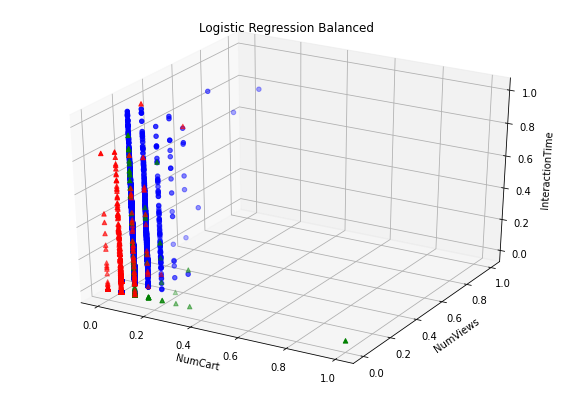

In [24]:
### START CODE HERE ###
cmlog = confusion_matrix(y_test, reg_predb)
acc   = accuracy(y_test, reg_predb)
rec   = recall(y_test, reg_predb)
prec  = precision(y_test, reg_predb)
f1    = f1_score(y_test, reg_predb)
### END CODE HERE ###
# Print the metrics, display the confusion matrix, and visualize the model
print(f'Accuracy = {acc}, Precision = {prec}, Recall = {rec}, F1-score = {f1}')
print('Confusion Matrix is:')
print(cmlog)
visualize_scatter_plot(X_test,y_test,reg_predb,'Logistic Regression Balanced')
#No improvement

## Task 3: Fit a Non-Linear Classifier, select from NN, Random Forest, Gradient Boosted Trees

### Unless you already know to use a deep learning framework, DON'T try running an NN classifier in Colab. Scikit-Learn doesn't offer GPU support, so training one of its neural networks will take forever. Your local system might be able to exploit CPU parallelization, though.

### Instantiate, train, and predict with the model

In [25]:
from sklearn.neural_network import MLPClassifier
### START CODE HERE ###
nn_model = MLPClassifier(random_state=0)
nn_model.fit(X_train, y_train)
nn_pred = nn_model.predict(X_test)
### END CODE HERE ###

### Evaluate the model

Accuracy = 0.9987573860046824, Precision = 0.995739392863483, Recall = 0.9165032679738562, F1-score = 0.9544797073087722
Confusion Matrix is:
[[424400     24]
 [   511   5609]]


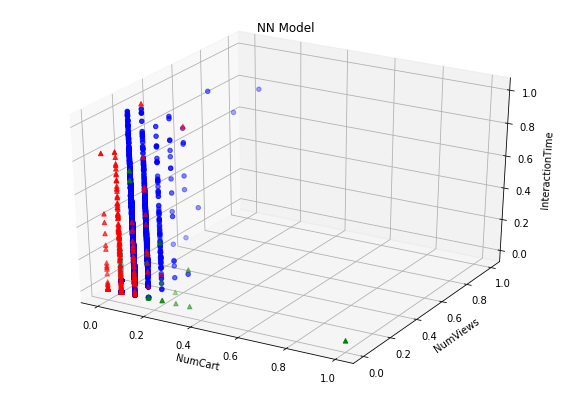

In [26]:
### START CODE HERE ###
cmnn = confusion_matrix(y_test, nn_pred)
acc  = accuracy(y_test, nn_pred)
rec  = recall(y_test, nn_pred)
prec = precision(y_test, nn_pred)
f1   = f1_score(y_test, nn_pred)
### END CODE HERE ###
# Print the metrics, display the confusion matrix, and visualize the model
print(f'Accuracy = {acc}, Precision = {prec}, Recall = {rec}, F1-score = {f1}')
print('Confusion Matrix is:')
print(cmnn)
visualize_scatter_plot(X_test,y_test,nn_pred,'NN Model')

## Task 4: Analyze importace of data sample balancing using Random forest and visualize Decision Tree

### Instantiate, train, predict with, and evaluate an unbalanced random forest classifier

In [27]:
cols = np.array((selected_columns[:-1])).astype(str)
print(cols)

['NumOfEventsInJourney' 'interactionTime' 'maxPrice' 'NumCart' 'NumView'
 'InsessionView']


Accuracy = 0.9980652383960756, Precision = 1.0, Recall = 0.8638888888888889, F1-score = 0.9269746646795828
Confusion Matrix is:
[[424424      0]
 [   833   5287]]


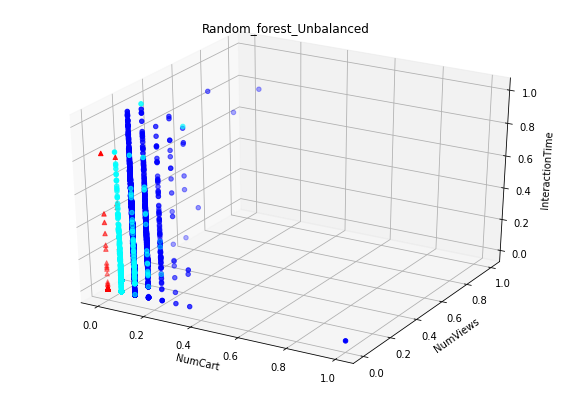

In [28]:
### START CODE HERE ###
# Instantiate the classifier
# Set the max depth to 5 and the random state to 0
clf = RandomForestClassifier(max_depth=5, random_state=0)
# Train the classifier
clf.fit(X_train, y_train)
# Use the classifier to make predictions from the test features
prediction = clf.predict(X_test)
# Compute the confusion matrix and evaluation metrics
cm   = confusion_matrix(y_test, prediction)
acc  = accuracy(y_test, prediction)
rec  = recall(y_test, prediction)
prec = precision(y_test, prediction)
f1   = f1_score(y_test, prediction)
### END CODE HERE ###
# Print the metrics, display the confusion matrix, and visualize the model
print(f'Accuracy = {acc}, Precision = {prec}, Recall = {rec}, F1-score = {f1}')
print('Confusion Matrix is:')
print(cm)
visualize_scatter_plot(X_test, y_test, prediction, 'Random_forest_Unbalanced')

In [29]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(clf.estimators_[0], max_depth=5, out_file='tree.dot', 
                feature_names = cols,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

### Repeat the previous exercise, but this time, incorporate class-balanced penalty weights

Accuracy = 0.9986435764985693, Precision = 0.9241495556236592, Recall = 0.9854575163398693, F1-score = 0.9538193895302863
Confusion Matrix is:
[[423929    495]
 [    89   6031]]


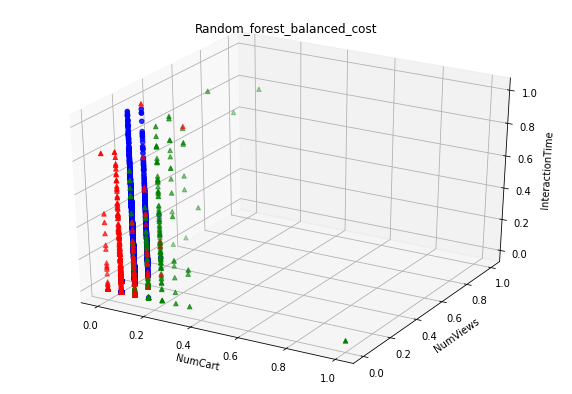

In [38]:
### START CODE HERE ###
# Instantiate the classifier
# Set the max depth to 5 and the random state to 0
clf = RandomForestClassifier(max_depth=5, random_state=0, class_weight='balanced')
# Train the classifier
clf.fit(X_train, y_train)
# Use the classifier to make predictions from the test features
prediction = clf.predict(X_test)
# Compute the confusion matrix and evaluation metrics
cm   = confusion_matrix(y_test, prediction)
acc  = accuracy(y_test, prediction)
rec  = recall(y_test, prediction)
prec = precision(y_test, prediction)
f1   = f1_score(y_test, prediction)
### END CODE HERE ###
# Print the metrics, display the confusion matrix, and visualize the model
print(f'Accuracy = {acc}, Precision = {prec}, Recall = {rec}, F1-score = {f1}')
print('Confusion Matrix is:')
print(cm)
visualize_scatter_plot(X_test,y_test,prediction,'Random_forest_balanced_cost')

In [30]:
cols = np.array((selected_columns[:-1])).astype(str)
print(cols)

['NumOfEventsInJourney' 'interactionTime' 'maxPrice' 'NumCart' 'NumView'
 'InsessionView']


In [31]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(clf.estimators_[0], max_depth=5, out_file='tree.dot', 
                feature_names = cols,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

### Finally, subsample the data so the two classes are equally represented when training the model

DON'T try running this in Colab. You'll get the following error message: `ValueError: object of too small depth for desired array`. It does seem to work when run locally, though.

Accuracy = 0.997700583447917, Precision = 0.9189807252531852, Recall = 0.9192810457516339, F1-score = 0.9191308609704295
Confusion Matrix is:
[[423928    496]
 [   494   5626]]


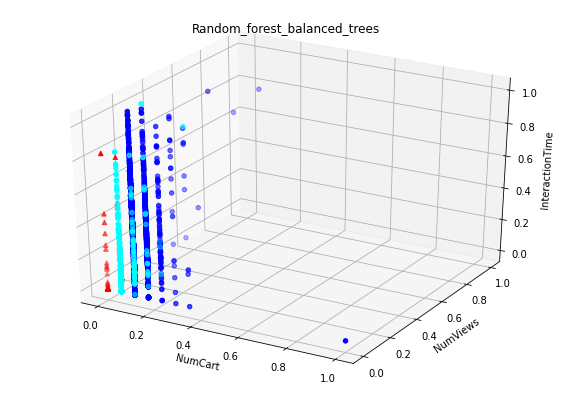

In [32]:
from imblearn.ensemble import BalancedRandomForestClassifier
### START CODE HERE ###
# Instantiate, train, and predict with the classifier
clf = BalancedRandomForestClassifier(max_depth=5, random_state=0)
#clf = BalancedRandomForestClassifier(max_depth=5, class_weight='balanced', random_state=0)
clf.fit(X_train, y_train)
predictionBR = clf.predict(X_test)
# Compute the confusion matrix and evaluation metrics
cm   = confusion_matrix(y_test, predictionBR)
acc  = accuracy(y_test, predictionBR)
rec  = recall(y_test, predictionBR)
prec = precision(y_test, predictionBR)
f1   = f1_score(y_test, predictionBR)
### END CODE HERE ###
# Print the metrics, display the confusion matrix, and visualize the model
print(f'Accuracy = {acc}, Precision = {prec}, Recall = {rec}, F1-score = {f1}')
print('Confusion Matrix is:')
print(cm)
visualize_scatter_plot(X_test, y_test, prediction, 'Random_forest_balanced_trees')

In [33]:
print(clf.estimators_[0])

DecisionTreeClassifier(max_depth=5, max_features='auto', random_state=209652396)


### Visualize the decision tree

In [34]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(clf.estimators_[0], max_depth=5, out_file='tree.dot', 
                feature_names = cols,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

# Report the following:

## 1. Comment on the decision tree between balanced and unbalanced classifiers

The first two decision points (at height 0 and 1) between all trees are very similar, first splitting on NumOfEventsInJourney and then NumView. Further down the tree, in general, all trees split on similar features at similar (but not identical) points, but the order is rearranged. Finally, the balanced random forest bases its decisions on far fewer samples (11,333 instead of 408,315).

## 2. Optimal Feature set contains 6 features named: 'NumOfEventsInJourney', 'interactionTime', 'maxPrice', 'NumCart', 'NumView', 'InsessionView'
Classification performance:
-------------------------------------------------------------------
|        Classifier  |Accuracy     |Precision|     Recall  | F1-score  |
|----|----|---|---|-----------------------------------------------------------------------------
|**Linear Classifiers**|
|Logistic Regression|0.9990268125905831|0.9440722854027107|0.9901960784313726|0.9665842571177925|
|**Nonlinear Classifiers**|
|Neural Network|0.9987573860046824|0.995739392863483|0.9165032679738562|0.9544797073087722|
|Random Forest|0.9980652383960756|1.0|0.8638888888888889|0.9269746646795828|
|Random Forest, Balanced Class Weights|0.9986435764985693|0.9241495556236592|0.9854575163398693|0.9538193895302863|
|Balanced Random Forest|0.997700583447917|0.9189807252531852|0.9192810457516339|0.9191308609704295|

### Conclusion
Based on the high values in general for all metrics, the selected models perform very well on the dataset. In order to determine the best model, though, it is important to have a single metric. Accuracy is not a good choice, since the dataset is highly imbalanced. We should choose precision if we want to penalize false positives, and recall if we want to penalize false negatives. A false positive would occur when we predict that a customer will purchase an item, but they do not; a false negative would occur when we predict that a customer will not purchase an item, but they do. In terms of estimating sales, it would probably be best to underpredict revenue--so we should prefer a model that penalizes false positives. Thus, we should pick a model that maximizes precision, so long as recall meets some minimum baseline. If we select the recall baseline at 0.9, then the best model is the Neural Network.

# Extra Credit
Perform hyperparameter tuning to find the models that maximize recall and F1-score.

## 1. Divide the training data into training and validation using k-fold cross validation.

In [30]:
# When we specify an int to the cv param for many sklearn functions, these are the splits we're getting.
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
NUM_FOLDS = 5
kf = KFold(n_splits=NUM_FOLDS, random_state=0, shuffle=True)
for train_indices_fold, val_indices_fold in kf.split(X_train):
    print('Train indices in fold ({0} total): {1}'.format(len(train_indices_fold), train_indices_fold))
    print('Val indices in fold ({0} total): {1}'.format(len(val_indices_fold), val_indices_fold))
    X_train_fold = X_train[train_indices_fold]
    y_train_fold = y_train[train_indices_fold]
    X_val_fold = X_train[val_indices_fold]
    y_val_fold = y_train[val_indices_fold]
    print(X_train_fold.shape)
    print(y_train_fold.shape)
    print(X_val_fold.shape)
    print(y_val_fold.shape)

Train indices in fold (516652 total): [     0      1      2 ... 645813 645814 645815]
Val indices in fold (129164 total): [     5     13     19 ... 645796 645802 645812]
(516652, 6)
(516652,)
(129164, 6)
(129164,)
Train indices in fold (516653 total): [     0      1      2 ... 645813 645814 645815]
Val indices in fold (129163 total): [     9     12     14 ... 645807 645808 645810]
(516653, 6)
(516653,)
(129163, 6)
(129163,)
Train indices in fold (516653 total): [     0      1      4 ... 645813 645814 645815]
Val indices in fold (129163 total): [     2      3      6 ... 645787 645789 645798]
(516653, 6)
(516653,)
(129163, 6)
(129163,)
Train indices in fold (516653 total): [     1      2      3 ... 645810 645812 645813]
Val indices in fold (129163 total): [     0      7     10 ... 645811 645814 645815]
(516653, 6)
(516653,)
(129163, 6)
(129163,)
Train indices in fold (516653 total): [     0      2      3 ... 645812 645814 645815]
Val indices in fold (129163 total): [     1      4     15 

## 2-4. Set a range for the hyperparameters; find the hyperparameters that minimize average validation loss over all folds; apply the best hyperparameters to the test data and report results.

In [77]:
# Model 1: Logistic Regression.
# You can keep increasing C and the performance doesn't fall.
# And you could try more parameters, but we've already found parameters that give us 1.0 recall.
parameters = {'class_weight': [None, 'balanced'],
              'C': [0.1, 1.0, 10.0, 100.0, 1000.0, 10000.0, 100000.0],
              'random_state': [0]}
estimator = LogisticRegression()
clf = GridSearchCV(estimator, parameters, cv=kf, scoring=['accuracy', 'recall', 'f1'], refit='recall')
clf.fit(X_train, y_train)
best_estimator = clf.best_estimator_
best_parameters = clf.best_params_
best_score = clf.best_score_
print('Best parameters: {0}'.format(best_parameters))
print('Best score: {0}'.format(best_score))
print('Scorer: {0}'.format(clf.scorer_))
print('Number of splits: {0}'.format(clf.n_splits_))
print('Mean validation accuracy for all models:\n{0}'.format(clf.cv_results_['mean_test_accuracy']))
print('Mean validation recall for all models:\n{0}'.format(clf.cv_results_['mean_test_recall']))
print('Mean validation F1 score for all models:\n{0}'.format(clf.cv_results_['mean_test_f1']))

Best parameters: {'C': 10.0, 'class_weight': 'balanced', 'random_state': 0}
Best score: 1.0
Scorer: {'accuracy': make_scorer(accuracy_score), 'recall': make_scorer(recall_score, average=binary), 'f1': make_scorer(f1_score, average=binary)}
Number of splits: 5
Mean validation accuracy for all models:
[0.98618957 0.99931869 0.99880926 0.99997058 0.99997368 1.
 0.99999845 1.         1.         1.         1.         1.
 1.         1.         1.         1.        ]
Mean validation recall for all models:
[0.0066769  0.99609383 0.91507442 0.99978202 0.99810631 1.
 0.99989095 1.         1.         1.         1.         1.
 1.         1.         1.         1.        ]
Mean validation F1 score for all models:
[0.01325714 0.97598668 0.95528092 0.99893593 0.9990518  1.
 0.99994546 1.         1.         1.         1.         1.
 1.         1.         1.         1.        ]


In [78]:
prediction = best_estimator.predict(X_test)
cm   = confusion_matrix(y_test, prediction)
acc  = accuracy(y_test, prediction)
rec  = recall(y_test, prediction)
prec = precision(y_test, prediction)
f1   = f1_score(y_test, prediction)
print(f'Accuracy = {acc}, Precision = {prec}, Recall = {rec}, F1-score = {f1}')
print('Confusion Matrix is:')
print(cm)

Accuracy = 0.9997305734140993, Precision = 0.9903626265926168, Recall = 0.990686274509804, F1-score = 0.9905244241137069
Confusion Matrix is:
[[424365     59]
 [    57   6063]]


In [31]:
# Model 2: Neural Network.
# This search space is really small because I just don't have the compute to do a ton.
print('Starting long training.')
parameters = {'hidden_layer_sizes': [(100,), (100, 100)],
              'activation': ['relu'],
              'alpha': [1e-4, 1e-3],
              'random_state': [0]}
estimator = MLPClassifier()
clf = GridSearchCV(estimator, parameters, cv=kf, scoring=['accuracy', 'recall', 'f1'], refit='recall')
clf.fit(X_train, y_train)
best_estimator = clf.best_estimator_
best_parameters = clf.best_params_
best_score = clf.best_score_
print('Best parameters: {0}'.format(best_parameters))
print('Best score: {0}'.format(best_score))
print('Scorer: {0}'.format(clf.scorer_))
print('Number of splits: {0}'.format(clf.n_splits_))
print('Mean validation accuracy for all models:\n{0}'.format(clf.cv_results_['mean_test_accuracy']))
print('Mean validation recall for all models:\n{0}'.format(clf.cv_results_['mean_test_recall']))
print('Mean validation F1 score for all models:\n{0}'.format(clf.cv_results_['mean_test_f1']))

Starting long training.
Best parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (100,), 'random_state': 0}
Best score: 1.0
Scorer: {'accuracy': make_scorer(accuracy_score), 'recall': make_scorer(recall_score, average=binary), 'f1': make_scorer(f1_score, average=binary)}
Number of splits: 5
Mean validation accuracy for all models:
[1.        1.        0.9999969 1.       ]
Mean validation recall for all models:
[1.         1.         0.99978202 1.        ]
Mean validation F1 score for all models:
[1.         1.         0.99989098 1.        ]


In [32]:
prediction = best_estimator.predict(X_test)
cm   = confusion_matrix(y_test, prediction)
acc  = accuracy(y_test, prediction)
rec  = recall(y_test, prediction)
prec = precision(y_test, prediction)
f1   = f1_score(y_test, prediction)
print(f'Accuracy = {acc}, Precision = {prec}, Recall = {rec}, F1-score = {f1}')
print('Confusion Matrix is:')
print(cm)

Accuracy = 0.9987573860046824, Precision = 0.995739392863483, Recall = 0.9165032679738562, F1-score = 0.9544797073087722
Confusion Matrix is:
[[424400     24]
 [   511   5609]]


In [33]:
# Model 3: Random Forest, Balanced Class Weights.
# Again, small search space for lightweight compute.
parameters = {'n_estimators': [50, 100],
              'max_depth': [5, 10],
              'max_features': ['auto'],
              'class_weight': ['balanced'],
              'random_state': [0]}
estimator = RandomForestClassifier(max_depth=5, random_state=0, class_weight='balanced')
clf = GridSearchCV(estimator, parameters, cv=kf, scoring=['accuracy', 'recall', 'f1'], refit='recall')
clf.fit(X_train, y_train)
best_estimator = clf.best_estimator_
best_parameters = clf.best_params_
best_score = clf.best_score_
print('Best parameters: {0}'.format(best_parameters))
print('Best score: {0}'.format(best_score))
print('Scorer: {0}'.format(clf.scorer_))
print('Number of splits: {0}'.format(clf.n_splits_))
print('Mean validation accuracy for all models:\n{0}'.format(clf.cv_results_['mean_test_accuracy']))
print('Mean validation recall for all models:\n{0}'.format(clf.cv_results_['mean_test_recall']))
print('Mean validation F1 score for all models:\n{0}'.format(clf.cv_results_['mean_test_f1']))

Best parameters: {'class_weight': 'balanced', 'max_depth': 5, 'max_features': 'auto', 'n_estimators': 50, 'random_state': 0}
Best score: 0.9992187605175673
Scorer: {'accuracy': make_scorer(accuracy_score), 'recall': make_scorer(recall_score, average=binary), 'f1': make_scorer(f1_score, average=binary)}
Number of splits: 5
Mean validation accuracy for all models:
[0.99350589 0.99349505 0.99983741 0.99984051]
Mean validation recall for all models:
[0.99921876 0.99921876 0.99644039 0.99655104]
Mean validation F1 score for all models:
[0.81060159 0.81035127 0.99416264 0.99427948]


In [34]:
prediction = best_estimator.predict(X_test)
cm   = confusion_matrix(y_test, prediction)
acc  = accuracy(y_test, prediction)
rec  = recall(y_test, prediction)
prec = precision(y_test, prediction)
f1   = f1_score(y_test, prediction)
print(f'Accuracy = {acc}, Precision = {prec}, Recall = {rec}, F1-score = {f1}')
print('Confusion Matrix is:')
print(cm)

Accuracy = 0.9986342859266416, Precision = 0.9269836369249769, Recall = 0.9812091503267973, F1-score = 0.9533259247499604
Confusion Matrix is:
[[423951    473]
 [   115   6005]]


## 5. Visualize the decision tree.

This tree splits on the same features that we saw above: first, NumOfEventsInJourney, then NumView. The split values are also similar. These splits are logical. It makes sense that a customer who views few items (low NumOfEventsInJourney and NumView) knows what they want and is more likely to purchase an item.

In [35]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(best_estimator.estimators_[0], max_depth=5, out_file='tree.dot', 
                feature_names = cols,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

## Tuned classification performance:
-------------------------------------------------------------------
|        Classifier  |Accuracy     |Precision|     Recall  | F1-score  |
|----|----|---|---|-----------------------------------------------------------------------------
|**Linear Classifiers**|
|Logistic Regression|0.9997305734140993|0.9903626265926168|0.990686274509804|0.99052442411|
|**Nonlinear Classifiers**|
|Neural Network|0.9987573860046824|0.995739392863483|0.9165032679738562|0.9544797073087722|
|Random Forest, Balanced Class Weight|0.9986342859266416|0.9269836369249769|0.9812091503267973|0.9533259247499604|

### Conclusion
Hyperparameter tuning resulted in some exceptional models. Even a simple logistic regression model performed extremely well, with high metrics across the board. We chose random forest with balanced class weights as our decision tree model because it had the highest F1 score of all the decision tree algorithms. The best model was Logistic Regression because it had the highest recall while preserving greater than 0.99 precision.